# Projet analyse de données : Velib

We consider the ‘Vélib’ data set, related to the bike sharing system of Paris. The data are loading profiles of the bike stations over one week, collected every hour, from the period Monday 2nd Sept. - Sunday 7th Sept., 2014. The loading profile of a station, or simply loading, is defined as the ratio of number of available bikes divided by the number of bike docks. A loading of 1 means that the station is fully loaded, i.e. all bikes are available. A loading of 0 means that the station is empty, all bikes have been rent.

From the viewpoint of data analysis, the individuals are the stations. The variables are the 168 time steps (hours in the week). The aim is to detect clusters in the data, corresponding to common customer usages. This clustering should then be used to predict the loading profile.


In [1]:
import matplotlib.pyplot as plt
from sklearn import model_selection
from sklearn import preprocessing
from sklearn import decomposition
import pandas as pd
import numpy as np
%matplotlib inline
from pylab import * 
import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

In [2]:
from IPython.display import display, HTML

display(HTML(data="""
<style>
    div#notebook-container    { width: 95%; }
    div#menubar-container     { width: 65%; }
    div#maintoolbar-container { width: 99%; }
</style>
"""))

On charge dans un premier temps les données vélib ainsi que d'autres pouvant être utiles

In [3]:
def dropOutOffParis(l):
    li = []
    for i in range(len(l)):
        d = l.iloc[i].split(",")
        v1 = float(d[0])
        v2 = float(d[1])
        if v1<48.91 and v1>48.80 and v2<2.42 and v2>2.25:
            li.append([v1,v2])
    return pd.DataFrame(np.array(li),columns=["lat","lon"])

In [4]:
ecoles = pd.read_csv("etablissements-scolaires-colleges.csv", sep =";")
loc_ecoles = ecoles.geo_point_2d
loc_ecoles = dropOutOffParis(loc_ecoles)

In [5]:
terrasses = pd.read_csv("etalages-et-terrasses.csv", sep =";")
loc_terrasses = terrasses.geo_point_2d
loc_terrasses = dropOutOffParis(loc_terrasses)

In [6]:
logements = pd.read_csv("logement-encadrement-des-loyers.csv", sep =";")
loc_logements = logements[logements["Nombre de pièces principales"] >= 1].geo_point_2d
loc_logements = dropOutOffParis(loc_logements)

In [7]:
cines = pd.read_csv("les_salles_de_cinemas_en_ile-de-france.csv", sep =";")
loc_cines = cines.geo
loc_cines = dropOutOffParis(loc_cines)

In [8]:
instSport = pd.read_csv("les-installations-sportives-dile-de-france.csv", sep =";")
loc_instSport = instSport[instSport.ins_partic == "Complexe sportif"]["Geo Point"]
loc_instSport = dropOutOffParis(loc_instSport)

In [9]:
bars = pd.read_csv("osm-fr-bars.csv", sep =";")
loc_bars = bars[bars.Nom.notna()]["Geo Point"]
loc_bars = dropOutOffParis(loc_bars)

In [10]:
loading = pd.read_csv('velibLoading.csv', sep = " ")
loading.head()

,Lun-00,Lun-01,Lun-02,Lun-03,Lun-04,Lun-05,Lun-06,Lun-07,Lun-08,Lun-09,...,Dim-14,Dim-15,Dim-16,Dim-17,Dim-18,Dim-19,Dim-20,Dim-21,Dim-22,Dim-23
1,0.038462,0.038462,0.076923,0.038462,0.038462,0.038462,0.038462,0.038462,0.107143,0.000000,...,0.296296,0.111111,0.111111,0.148148,0.307692,0.076923,0.115385,0.076923,0.153846,0.153846
2,0.478261,0.478261,0.478261,0.434783,0.434783,0.434783,0.434783,0.434783,0.260870,0.043478,...,0.043478,0.000000,0.217391,0.130435,0.045455,0.173913,0.173913,0.173913,0.260870,0.391304
3,0.218182,0.145455,0.127273,0.109091,0.109091,0.109091,0.090909,0.090909,0.054545,0.109091,...,0.259259,0.259259,0.203704,0.129630,0.148148,0.296296,0.314815,0.370370,0.370370,0.407407
4,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,0.952381,1.000000,1.000000,1.000000,...,1.000000,1.000000,0.904762,0.857143,0.857143,0.857143,0.761905,0.761905,0.761905,0.761905
5,0.927536,0.811594,0.739130,0.724638,0.724638,0.724638,0.724638,0.724638,0.753623,0.971014,...,0.227273,0.454545,0.590909,0.833333,1.000000,0.818182,0.636364,0.712121,0.621212,0.575758


In [11]:
velibAdds = pd.read_csv('velibAdds.csv', sep = " ")
velibAdds.head()

,longitude,latitude,bonus,names
1,2.377389,48.886300,0,EURYALE DEHAYNIN
2,2.317591,48.890020,0,LEMERCIER
3,2.330447,48.850297,0,MEZIERES RENNES
4,2.271396,48.833734,0,FARMAN
5,2.366897,48.845887,0,QUAI DE LA RAPEE


# 1 Statistiques descriptives

## 1.1 Exemple sur 16 stations

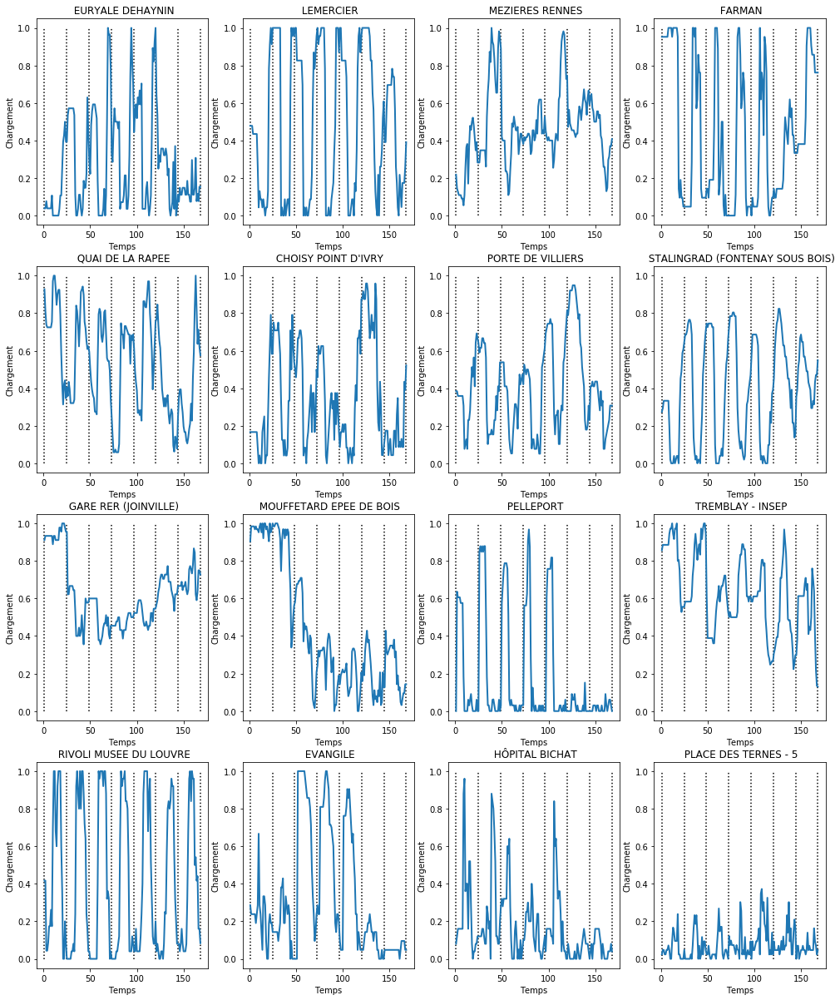

In [12]:
# Graphique de l'état de chargement des stations, les 16 premières

T16prem = loading.iloc[0:16]

p = loading.columns.size
Time = np.linspace(1, p, p)

plt.figure(1,figsize = (17, 21))
for k in range(16):
    ax = plt.subplot(4,4,k+1)
    plt.plot(Time, loading.transpose()[k+1], linewidth = 2)
    plt.xlabel('Temps')
    plt.ylabel('Chargement')
    plt.title(velibAdds.names[k+1])
    vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
plt.show()

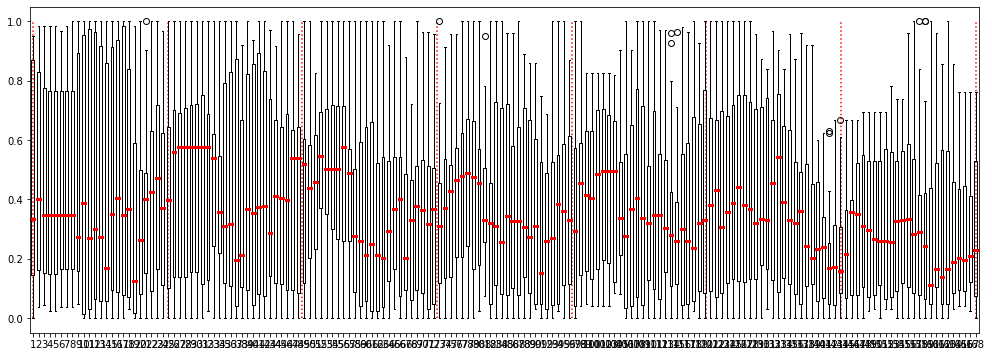

In [13]:
# Boxplot des variables ordonnées chronologiquement, sur les 16 premières stations

p = loading.columns.size
Time = np.linspace(1, p, p)

fig = plt.figure(1,figsize = (17, 6))
ax = fig.add_subplot(111)
bp = ax.boxplot(T16prem.transpose())
for median in bp['medians']:
    median.set(color ='red',linewidth = 3)
vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "red", linestyle = "dotted")
plt.show()

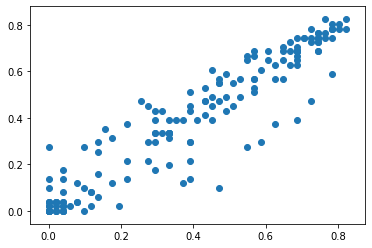

In [14]:
# Affichage du chargement à t en fonction du chargement à t+h (corrélation temporelle), pour les 16 premières stations

station = T16prem.iloc[7]
Station = np.array(station)
plt.scatter(Station,np.concatenate([Station[1:],[Station[0]]]))
plt.show()

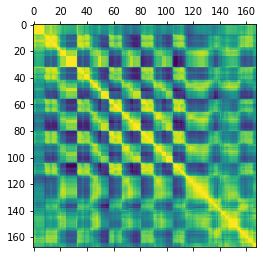

In [15]:
# Matrice de corrélation, pour les 16 premières stations

plt.matshow(T16prem.corr())

## 1.2 Représentation géographique des stations

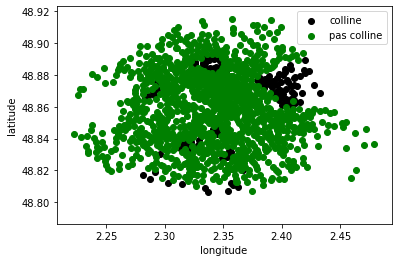

In [16]:
# Affichage géographique avec les stations en hauteur en noir et les autres en vert.

veliAddshills = velibAdds[velibAdds.bonus == 1]
veliAddsnohills = velibAdds[velibAdds.bonus == 0]

plt.figure(2)
plt.scatter(veliAddshills["longitude"],veliAddshills["latitude"],color="black",label="colline")
plt.scatter(veliAddsnohills["longitude"],veliAddsnohills["latitude"],color="green",label="pas colline")
plt.ylabel("latitude")
plt.xlabel("longitude")
plt.legend()
plt.show()

In [17]:
# Il s'agit de la même représentation que ci-dessus mais avec la map intéractive de Paris en fond

import folium

m = folium.Map(location=[48.86, 2.35],zoom_start=12.4)
for i in range (len(velibAdds)):
    l = velibAdds.iloc[i]
    if l.bonus:
        folium.Circle(
            radius=40,
            location=[l["latitude"], l["longitude"]],
            color="black",
            fill=True,
        ).add_to(m)
    else:
        folium.Circle(
            radius=40,
            location=[l["latitude"], l["longitude"]],
            color="green",
            fill=True,
        ).add_to(m)
m

In [18]:
# Répartition géographique des autres bases de données

m = folium.Map(location=[48.86, 2.35],zoom_start=12.4)

locs = [loc_ecoles, loc_terrasses, loc_logements, loc_cines, loc_instSport, loc_bars]

def addtoFMap(m,loc,text=""):
    for i in range (len(loc)):
        folium.Circle(
            location=[loc.iloc[i].lat,loc.iloc[i].lon],
            radius=40,
            color="white",
            tooltip=text
        ).add_to(m)

def plotGaresParis(m):
    coords = [[48.84103555241712, 2.3204091008975807],[48.84428694995535, 2.374377466531446],[48.876309473822495, 2.3588566351030975],[48.880945610900056, 2.355310660314462],[48.87745173327004, 2.3245506094136696],[48.841719103784975, 2.36609286876233]]
    for c in coords:
        folium.Marker(
            location=[c[0],c[1]],
        ).add_to(m)
    
#addtoFMap(m, loc_cines)
plotGaresParis(m)
m

### 1.2.1 Cas des stations sur les collines

In [19]:
# Sélection des stations en hauteur

loadinghills = loading[velibAdds.bonus == 1]

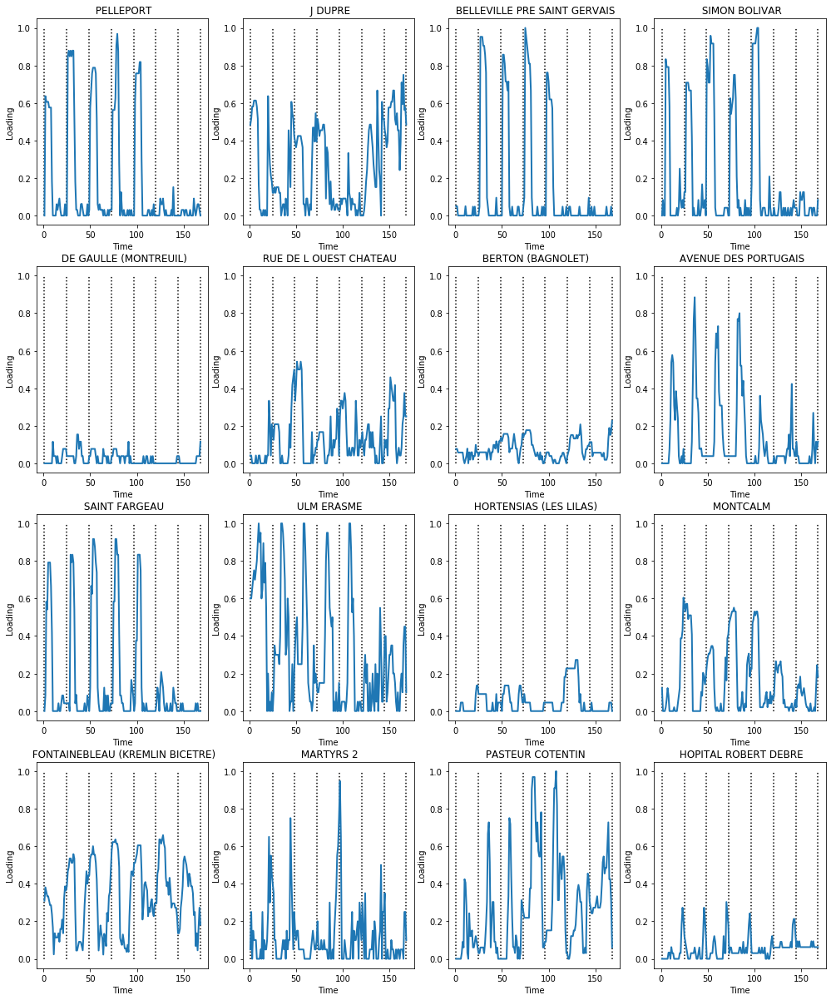

In [20]:
# Graphique de l'état de chargement des stations, 16 affichées ici

p = loadinghills.columns.size
Time = np.linspace(1, p, p)

plt.figure(3,figsize = (17, 21))
for k in range(16):
    ax = plt.subplot(4,4,k+1)
    plt.plot(Time, loadinghills.transpose()[loadinghills.transpose().columns[k]], linewidth = 2)
    plt.xlabel('Time')
    plt.ylabel('Loading')
    plt.title(veliAddshills.names[loadinghills.transpose().columns[k]])
    vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
plt.show()

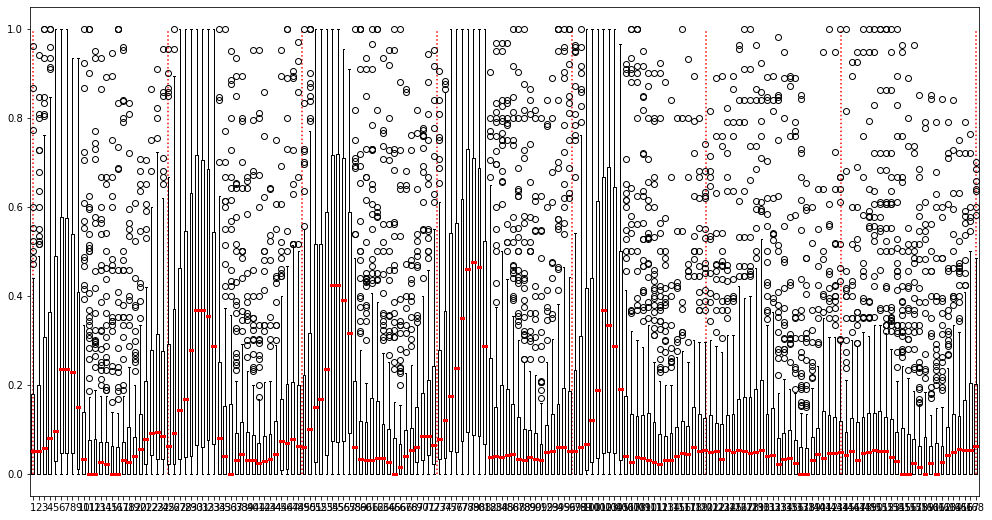

In [21]:
# Boxplot des variables ordonnées chronologiquement, pour les stations en hauteurs

p = loadinghills.columns.size
Time = np.linspace(1, p, p)

fig = plt.figure(1,figsize = (17, 9))
ax = fig.add_subplot(111)
bp = ax.boxplot(loadinghills.transpose())
for median in bp['medians']:
    median.set(color ='red',linewidth = 3)
vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "red", linestyle = "dotted")
plt.show()

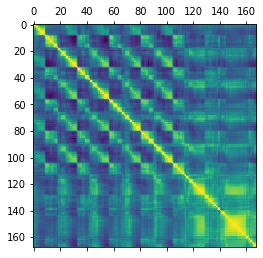

In [22]:
# Matrice de corrélation, pour les stations en hauteurs

plt.matshow(loadinghills.corr())

### 1.2.2 Cas des stations sur du plat

In [23]:
# Sélection des stations sur du plat

loadingnohills = loading[velibAdds.bonus == 0]

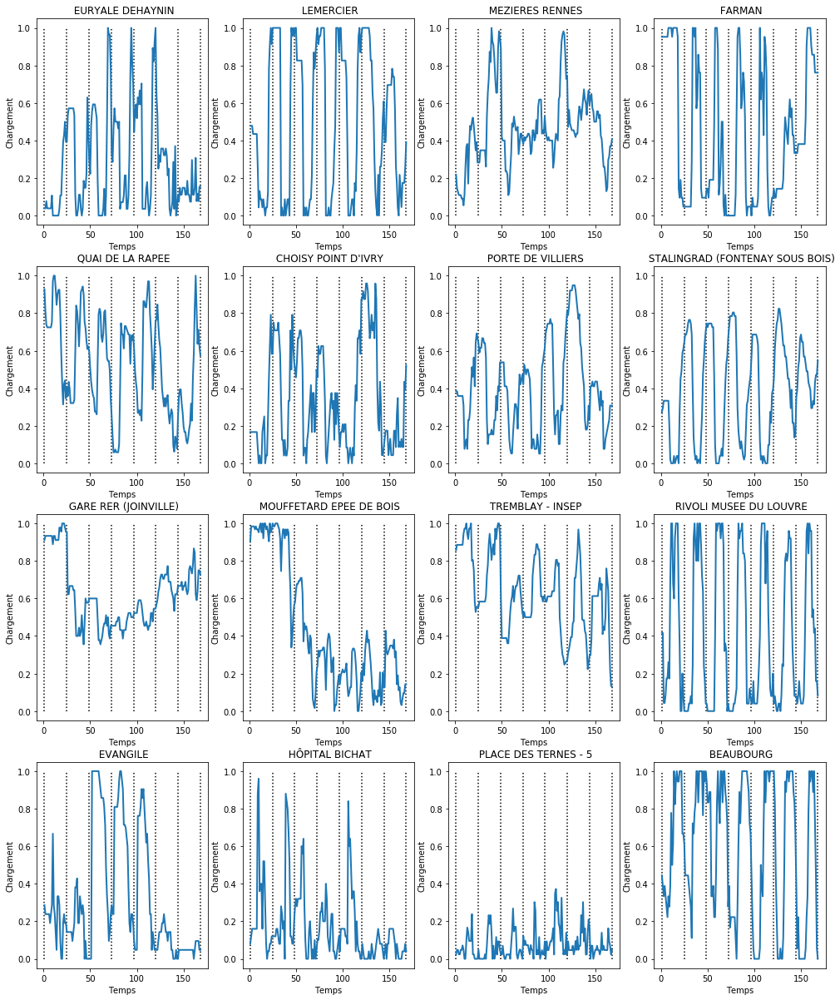

In [24]:
# Graphique de l'état de chargement des stations, 16 affichées ici

p = loadingnohills.columns.size
Time = np.linspace(1, p, p)

plt.figure(3,figsize = (17, 21))
for k in range(16):
    ax = plt.subplot(4,4,k+1)
    plt.plot(Time, loadingnohills.transpose()[loadingnohills.transpose().columns[k]], linewidth = 2)
    plt.xlabel('Temps')
    plt.ylabel('Chargement')
    plt.title(veliAddsnohills.names[loadingnohills.transpose().columns[k]])
    vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
plt.show()

(168, 1062)


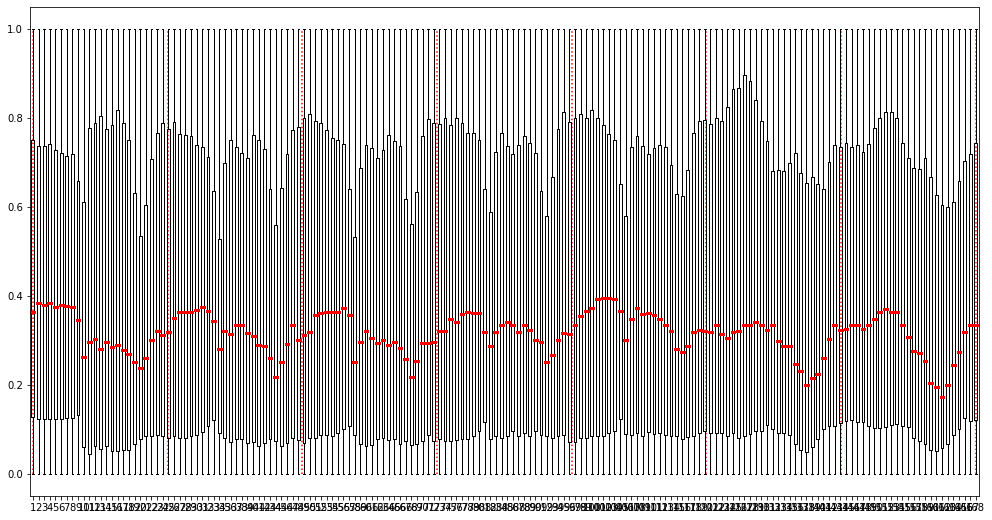

In [25]:
# Boxplot des variables ordonnées chronologiquement, pour les stations sur du plat

p = loadingnohills.columns.size
Time = np.linspace(1, p, p)



fig = plt.figure(1,figsize = (17, 9))
ax = fig.add_subplot(111)
print(np.shape(loadingnohills.transpose()))
bp = ax.boxplot(loadingnohills.transpose())
for median in bp['medians']:
    median.set(color ='red',linewidth = 3)
vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "red", linestyle = "dotted")
plt.show()

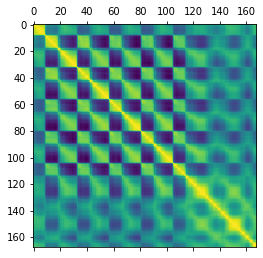

In [26]:
# Matrice de corrélation, pour les stations sur du plat

plt.matshow(loadingnohills.corr())

# 2 ACP

In [27]:
# Fonctions utiles pour la représentation de l'acp

def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks: # On affiche les 3 premiers plans factoriels, donc les 6 premières composantes
        if d2 < n_comp:

            # initialisation de la figure
            fig, ax = plt.subplots(figsize=(7,6))

            # détermination des limites du graphique
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax, ymin, ymax = min(pcs[d1,:]), max(pcs[d1,:]), min(pcs[d2,:]), max(pcs[d2,:])

            # affichage des flèches
            # s'il y a plus de 30 flèches, on n'affiche pas le triangle à leur extrémité
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                   pcs[d1,:], pcs[d2,:], 
                   angles='xy', scale_units='xy', scale=1, color="grey")
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color='black'))
            
            # affichage des noms des variables  
            if labels is not None:  
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center', va='center', rotation=label_rotation, color="blue", alpha=0.5)
            
            # affichage du cercle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # définition des limites du graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)
        
            # affichage des lignes horizontales et verticales
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Cercle des corrélations (F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)
        
def display_factorial_planes(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(7,6))
        
            # affichage des points
            if illustrative_var is None:
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show(block=False)

def display_scree_plot(pca):
    scree = pca.explained_variance_ratio_*100
    plt.bar(np.arange(len(scree))+1, scree)
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

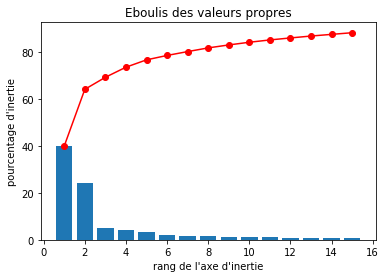

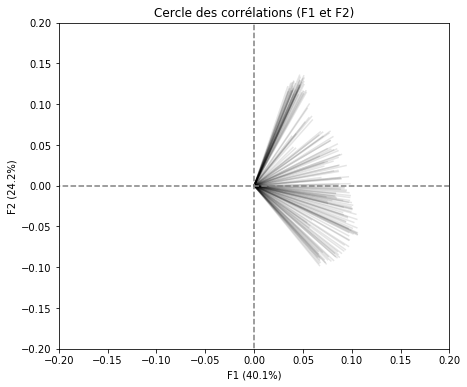

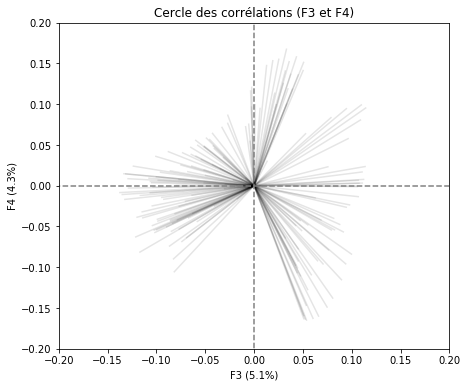

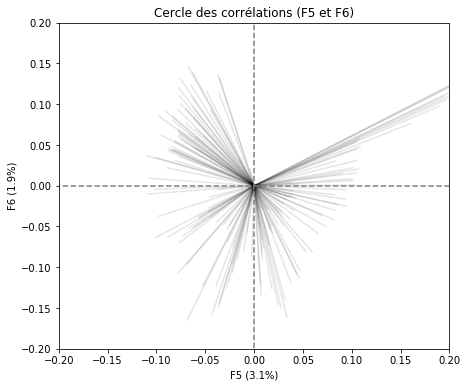

In [28]:
n_comp = 15
loadingR = preprocessing.scale(loading)

pca = decomposition.PCA(n_components=n_comp)
C = pca.fit(loading).transform(loading)

# Eboulis des valeurs propres
display_scree_plot(pca)

# Cercle des corrélations
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(0,1),(2,3),(4,5)], lims = (-0.2, 0.2, -0.2, 0.2))

plt.show()

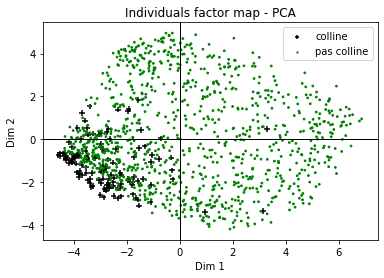

In [29]:
plt.scatter(C[:,0],C[:,1],velibAdds.bonus*30,c="black",marker="+", label = "colline")
plt.scatter(C[:,0],C[:,1],-(velibAdds.bonus-1)*3,c="green", label = "pas colline")
plt.axvline(0,c="black",linewidth=1)
plt.axhline(0,c="black",linewidth=1)
plt.xlabel("Dim 1")
plt.ylabel("Dim 2")
plt.title('Individuals factor map - PCA')
plt.legend()
plt.show()

Les 2 dimensions du site sur la colline sont concentrées dans le demi-axe négatif. Comme nous l'avons vu précédemment, le site sur la colline était rarement utilisé le week-end. Il est logique que la première dimension soit négative.

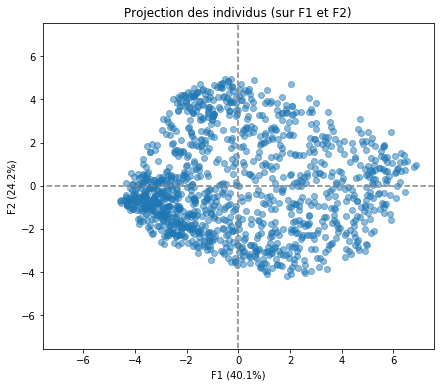

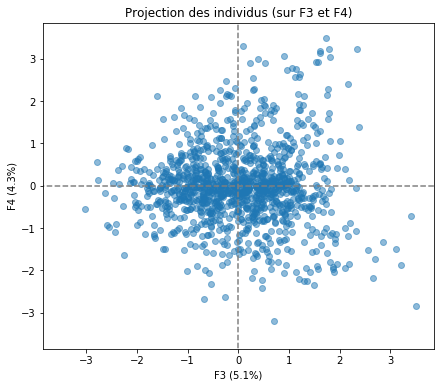

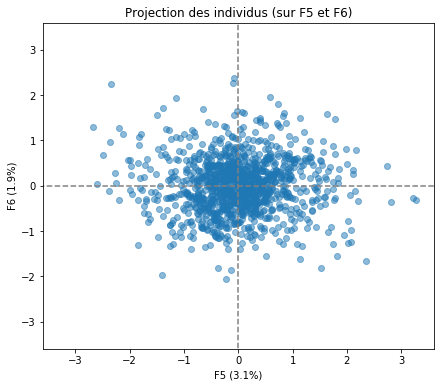

In [30]:
# Projection des individus
X_projected = pca.transform(loading)
display_factorial_planes(X_projected, n_comp, pca, [(0,1),(2,3),(4,5)], alpha = 0.5)

plt.show()

# 3 Clustering

## 3.1 KMeans

In [31]:
n_clusters = 6

def affichageCourbes(y_pred,n_clusters,moyennes):
    plt.figure(3,figsize = (20, 20))
    for k in range(n_clusters):
        ax = plt.subplot(4,2,k+1)
        ind = np.where(y_pred == k)[0]
        for i in ind:
            y_affichage = np.array(loading)[i]
            plt.plot(Time, y_affichage, linewidth = 0.1, color = "blue")
        plt.plot(Time, moyennes[k], linewidth = 2, color = "red")
        plt.xlabel('Temps')
        plt.ylabel('Chargement')
        plt.title(f"classe {k+1}")
        vlines(x = np.linspace(1, p, 8), ymin = ylim()[0], ymax = ylim()[1], colors = "black", linestyle = "dotted")
    plt.show()
    
def affichageGeoClusters(velibAdds,y_pred,n_clusters, j = 0, justeColline = False,gares=False):
    if j == 0:
        j = [k for k in range(n_clusters)]
    plt.figure(figsize=(15,10))
    col = ["black","red","purple","green","blue","orange","pink"]
    m = folium.Map(location=[48.86, 2.35],zoom_start=12.4)
    for k in range(n_clusters):
        ind = np.where(y_pred == k)[0]
        plt.scatter(velibAdds["longitude"].iloc[ind],velibAdds["latitude"].iloc[ind],color=col[j[k]],s=35,label=f"classe {k+1}")
        for i in ind:
            if not justeColline or velibAdds["bonus"].iloc[i] == 1:
                folium.Circle(
                    radius=40,
                    location=[velibAdds["latitude"].iloc[i], velibAdds["longitude"].iloc[i]],
                    color=col[j[k]],
                    fill=True,
                ).add_to(m)
    
    plt.ylabel("latitude")
    plt.xlabel("longitude")
    plt.legend()
    plt.show()
    #addtoFMap(m, loc_cines)
    if gares:
        plotGaresParis(m)
    display(m)
    

def crossTable(classe1, classe2):
    table = pd.crosstab(classe1, classe2, rownames = ['classes ACP'], colnames = ['classes données brutes'])
    a = np.zeros(np.shape(table)[0])
    b = np.zeros(np.shape(table)[0])
    for j in range (0, np.shape(table)[0]):
        for i in range (0, np.shape(table)[0]):
            if (a[j] < table[i][j]):
                a[j] = table[i][j]
                b[j] = i                       
                                             
    print ("")
    print ("max colonne", a)
    print ("j=", b)
    print ("")
    tablebis = np.copy(table)
    for i in range (0, np.shape(table)[0]):
        tablebis[i][:] = table[b[i]][:]
    print(f"Il y a {np.sum(tablebis)-np.sum(np.diag(tablebis))} différences entre les deux tables.")
    jt = np.zeros(len(b))
    for i,ie in enumerate(b):
        ie = int(ie)
        jt[ie]=i
    print(jt)
    return tablebis


### 3.1.1 Clustering sur les données

In [32]:
# Choix des options
kmeans = KMeans(n_clusters=n_clusters, random_state=76876)
# Exécution de l'algorithme
y_pred = kmeans.fit_predict(loading)

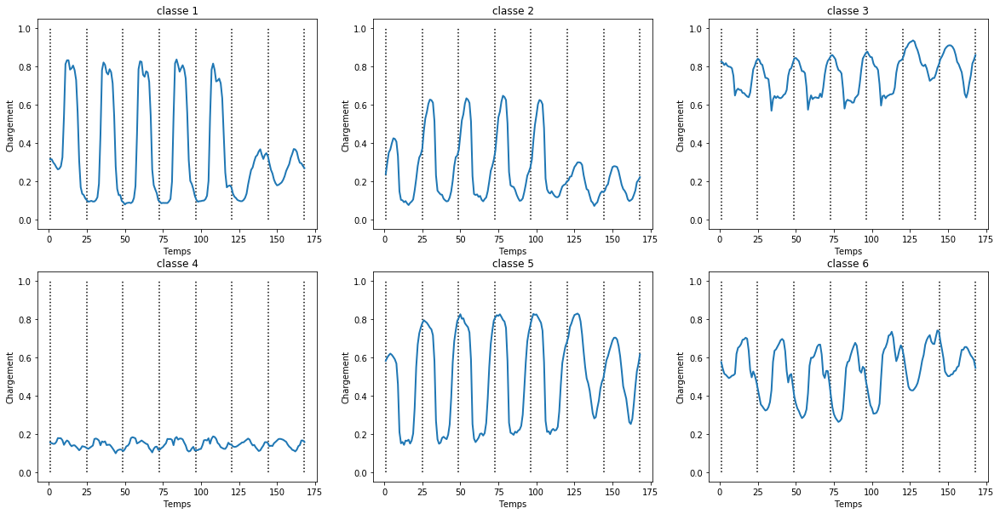

In [33]:
plt.figure(3,figsize = (20, 10))
for k in range(n_clusters):
    ax = plt.subplot(2,3,k+1)
    plt.plot(Time, kmeans.cluster_centers_[k], linewidth = 2)
    plt.xlabel('Temps')
    plt.ylabel('Chargement')
    plt.title(f"classe {k+1}")
    vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
plt.show()

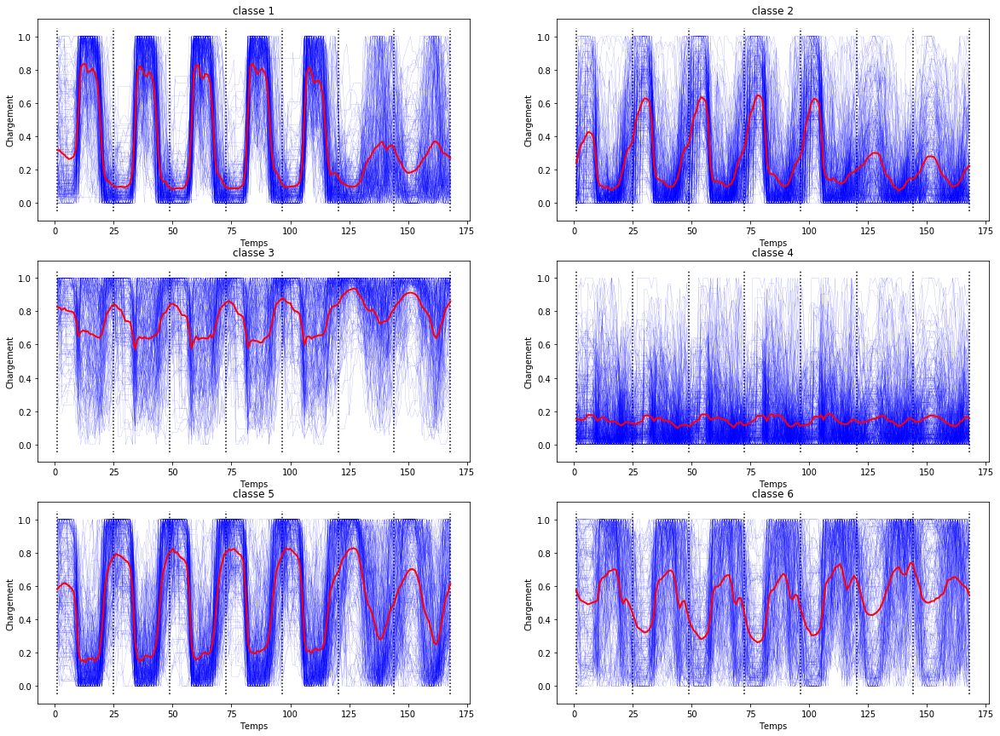

In [34]:
affichageCourbes(y_pred,n_clusters,kmeans.cluster_centers_)

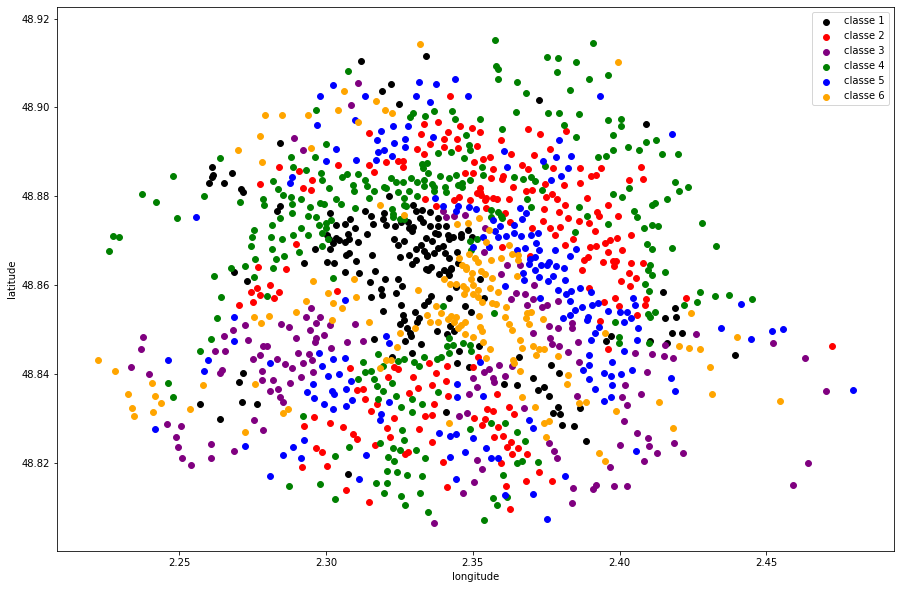

In [35]:
affichageGeoClusters(velibAdds,y_pred,n_clusters,gares=True)

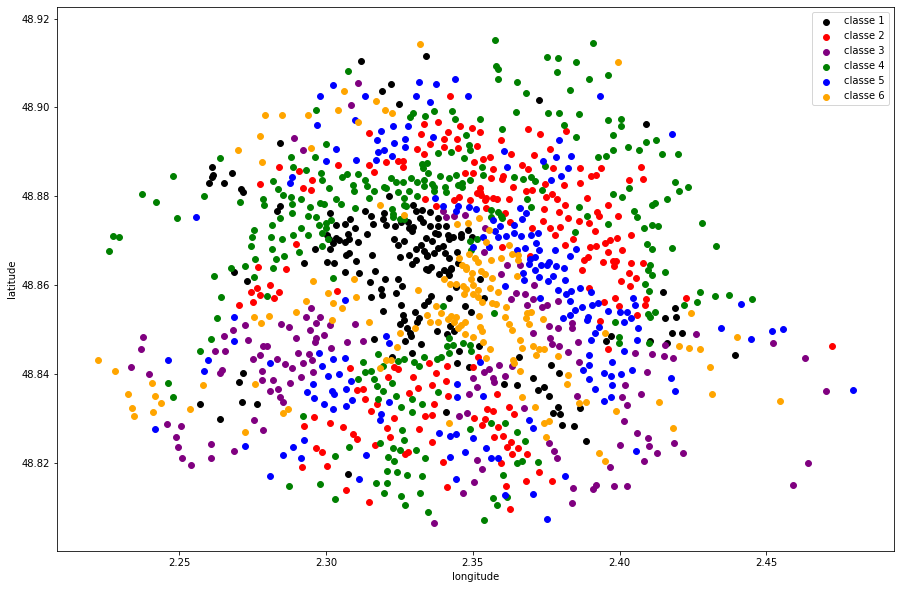

In [36]:
affichageGeoClusters(velibAdds,y_pred,n_clusters,justeColline = True)

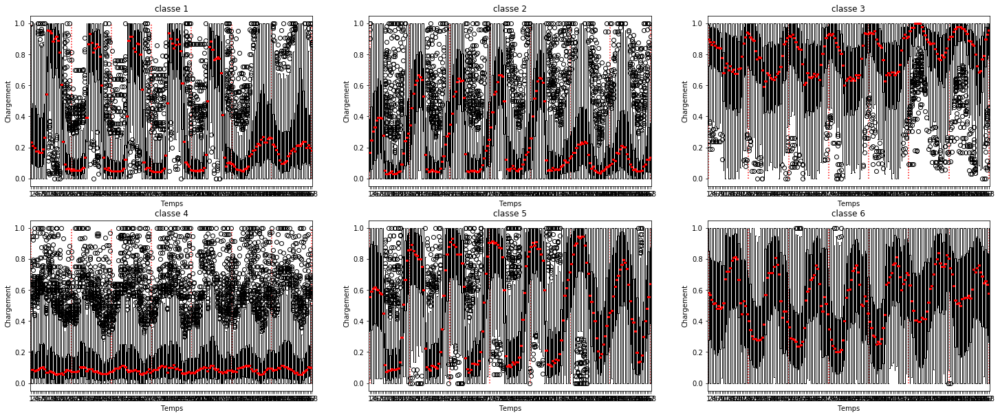

In [37]:
p = loading.columns.size
Time = np.linspace(1, p, p)

plt.figure(3,figsize = (25, 21))
for k in range(n_clusters):
    ax = plt.subplot(4,3,k+1)
    ind = np.where(y_pred == k)[0]
    B = np.array(loading)[ind]
    bp = ax.boxplot(B)
    for median in bp['medians']:
        median.set(color ='red',linewidth = 3)
    plt.xlabel('Temps')
    plt.ylabel('Chargement')
    plt.title(f"classe {k+1}")
    vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "red", linestyle = "dotted")
plt.savefig("KmeansBrut_boxplot.png")

### 3.1.2 Clustering sur les coordonnées de l'ACP

In [38]:
C_pca5 = C[:,:5]

In [39]:
# Choix des options
kmeans_pca5 = KMeans(n_clusters=n_clusters, random_state=76876)
# Exécution de l'algorithme
y_pred_pca5 = kmeans_pca5.fit_predict(C_pca5)

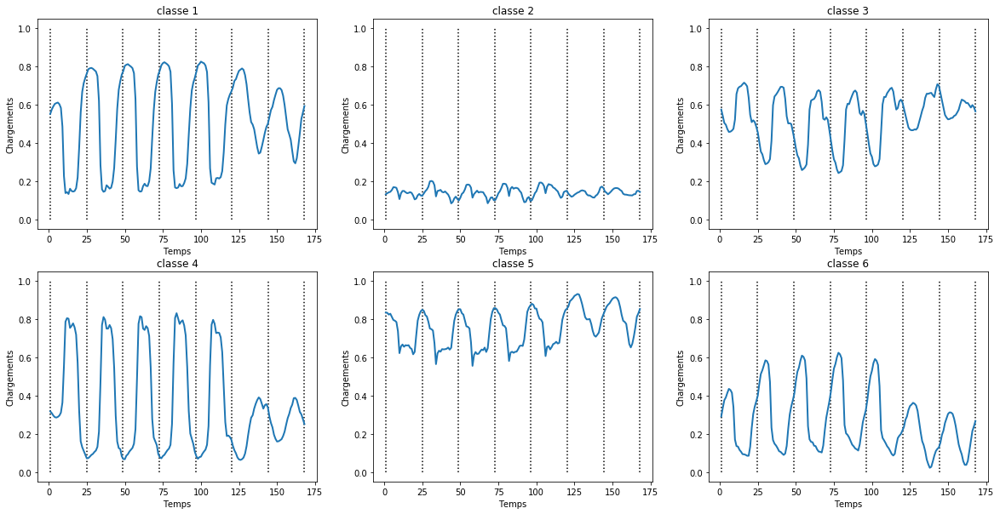

In [40]:
bar = kmeans_pca5.cluster_centers_
complement = np.zeros((n_clusters,10))
bar_inv = pca.inverse_transform(np.hstack((bar,complement)))


plt.figure(3,figsize = (20, 10))
for k in range(n_clusters):
    ax = plt.subplot(2,3,k+1)
    plt.plot(Time, bar_inv[k], linewidth = 2)
    plt.xlabel('Temps')
    plt.ylabel('Chargements')
    plt.title(f"classe {k+1}")
    vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
plt.show()

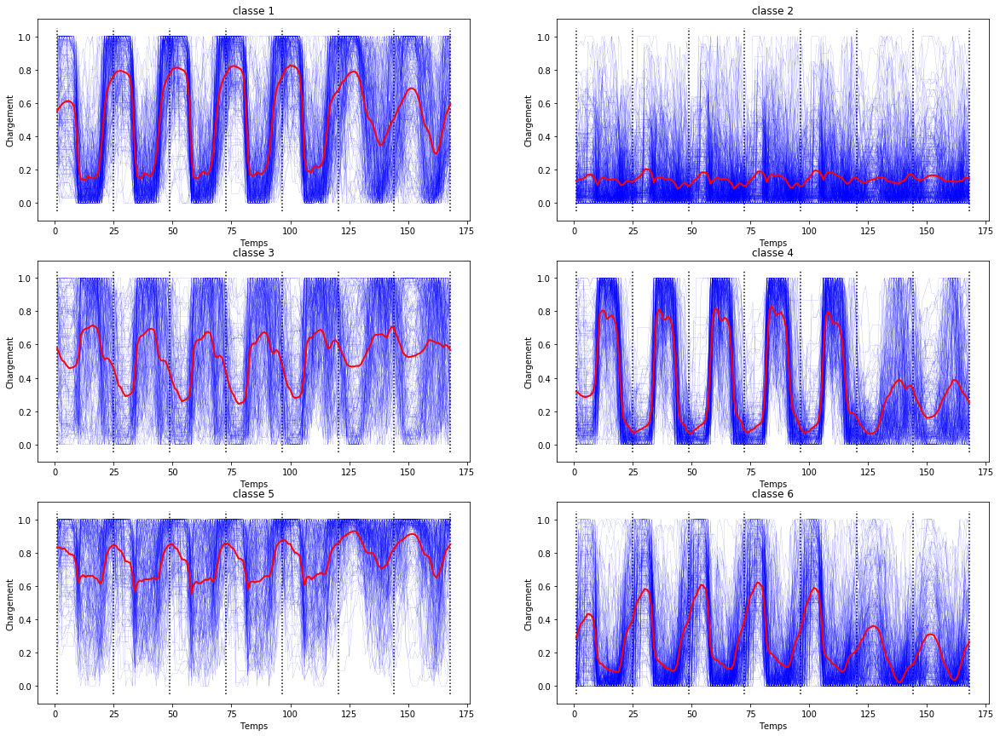

In [41]:
affichageCourbes(y_pred_pca5,n_clusters,bar_inv)

In [42]:
crossTable(y_pred,y_pred_pca5)


max colonne [184. 206. 147. 291. 188. 151.]
j= [3. 5. 4. 1. 0. 2.]

Il y a 22 différences entre les deux tables.
[4. 3. 5. 0. 2. 1.]


array([[184,   1,   0,   2,   0,   1],
       [  0, 206,   0,   3,   4,   0],
       [  0,   0, 147,   0,   1,   2],
       [  0,   7,   0, 291,   0,   0],
       [  0,   0,   0,   0, 188,   0],
       [  1,   0,   0,   0,   0, 151]], dtype=int64)

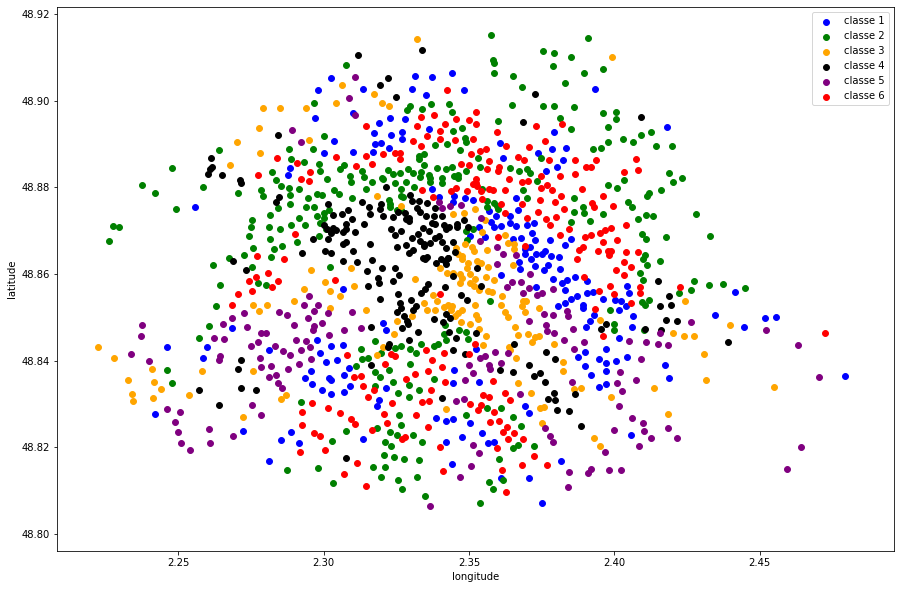

In [43]:
affichageGeoClusters(velibAdds,y_pred_pca5,n_clusters,[4,3,5,0,2,1])

## 3.2 Classification hiérarchique

### 3.2.1 Clustering sur les données

In [44]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, average

Z = linkage(loading,method='ward',metric='euclidean')
# On utilise ici directement la méthode sélectionné avec R: ward

On affiche ici le graphe des silhouettes pour 3,4,5 et 6 classes ainsi que le taux de chargement de chaque classe avec les positions géographique

For n_clusters = 3 The average silhouette_score is : 0.2260892238417287


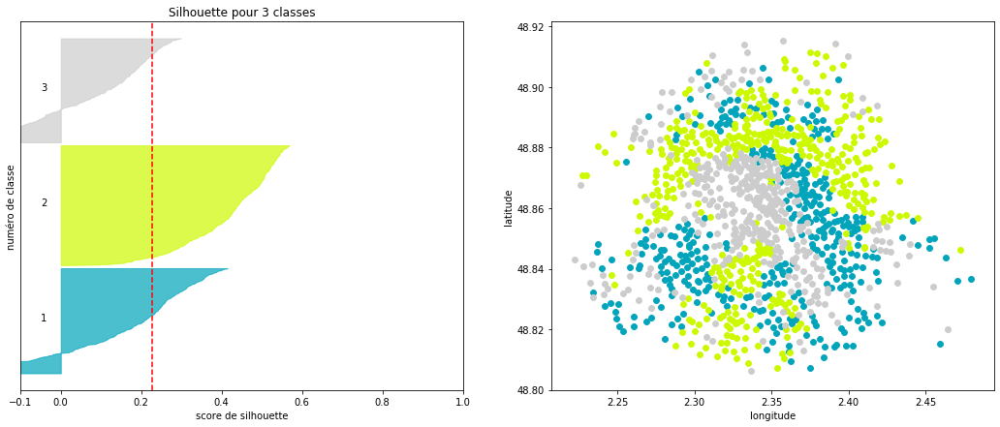

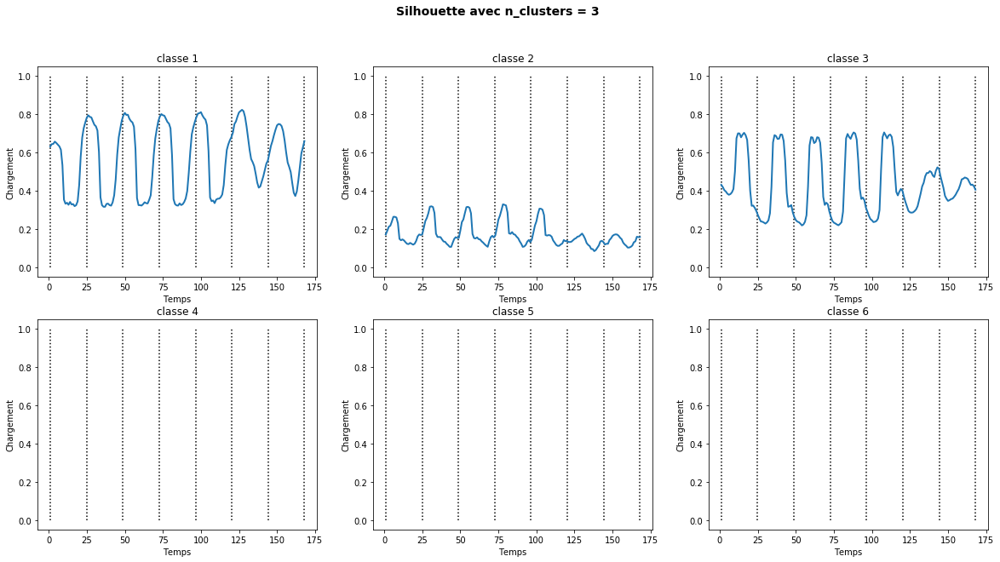

For n_clusters = 4 The average silhouette_score is : 0.20612845716743522


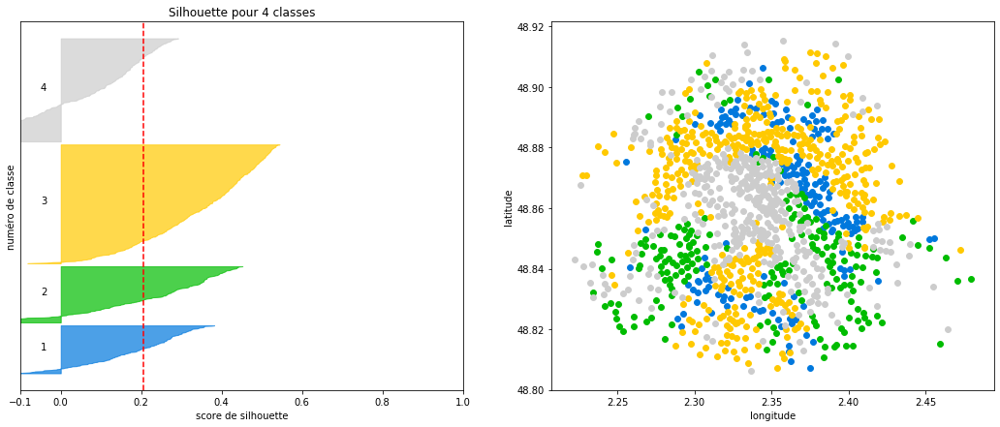

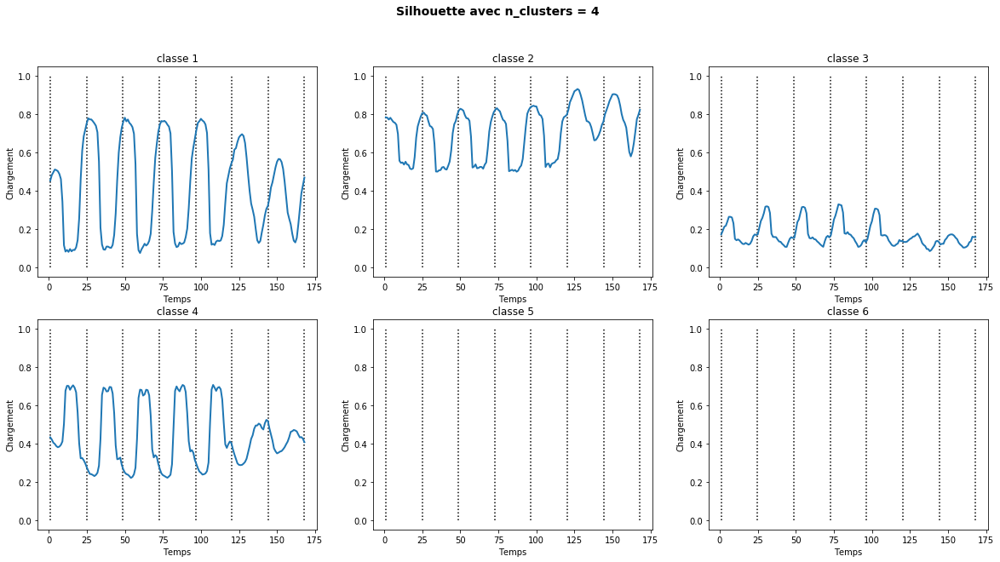

For n_clusters = 5 The average silhouette_score is : 0.19793487935162904


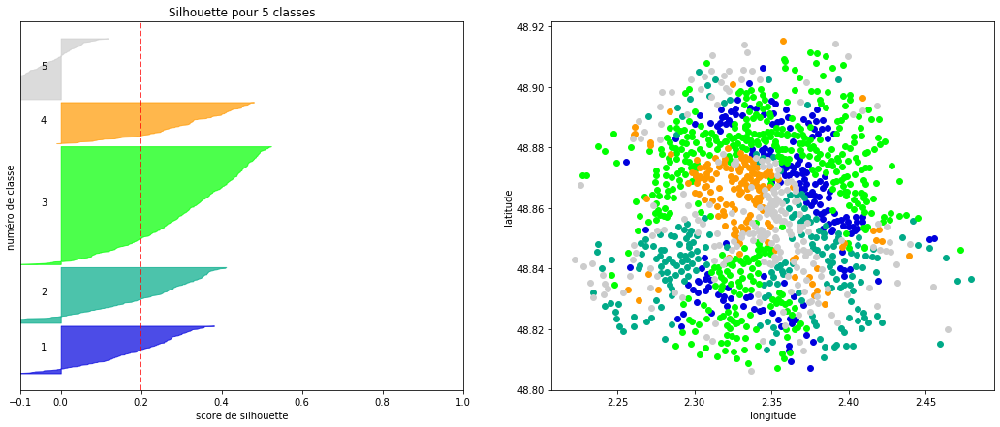

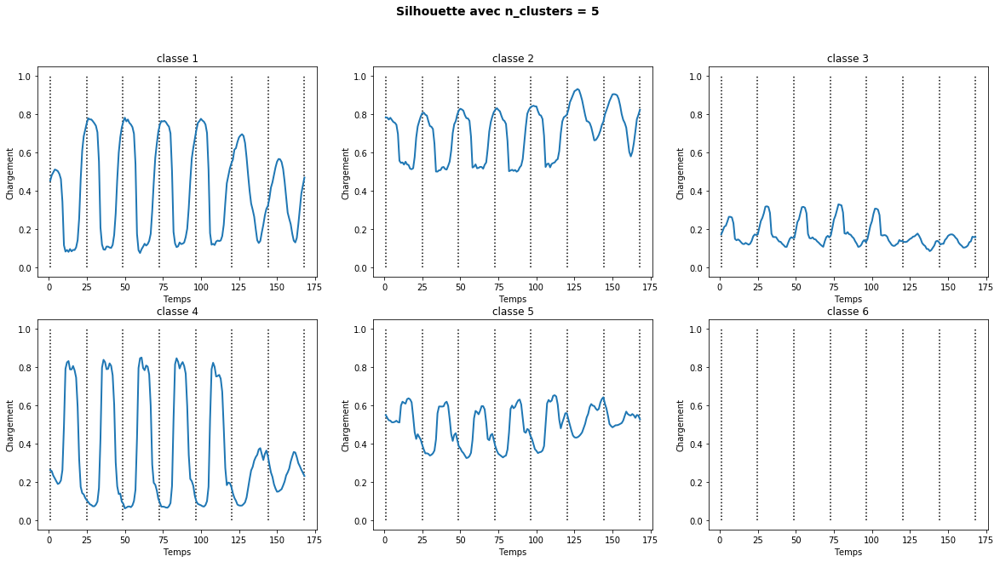

For n_clusters = 6 The average silhouette_score is : 0.13847792171014658


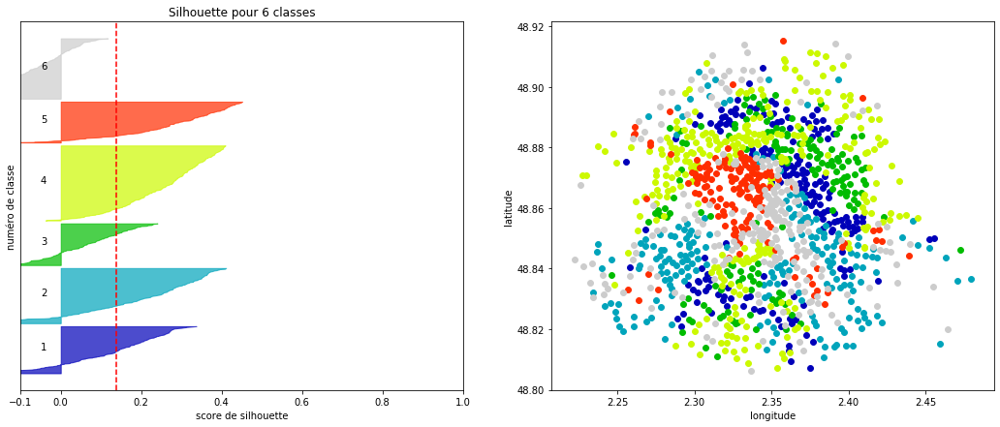

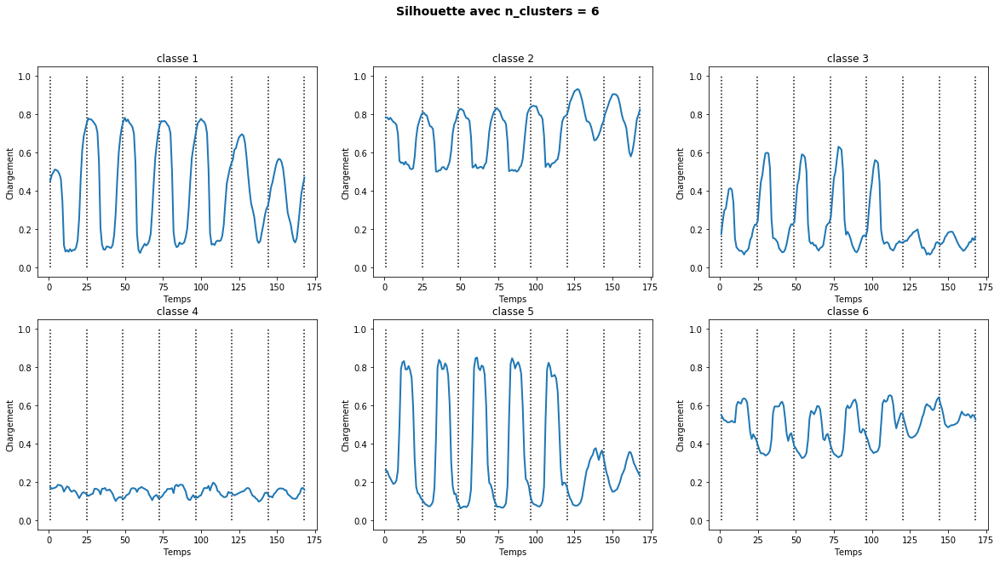

In [45]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm




range_n_clusters = [3,4,5,6] #3,4,5,6

for n_clustersf in range_n_clusters:
    
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)
    
    ax1.set_xlim([-0.1, 1])
    
    cluster_labels = fcluster(Z, n_clustersf, criterion="maxclust")
    #print(cluster_labels)
    
    cluster_labels = cluster_labels -1
    cah_means = []
    plt.figure(3,figsize = (20, 10))
    for k in range(n_clusters):
        ax = plt.subplot(2,3,k+1)
        cah_means.append(np.mean(loading[cluster_labels==k]))
        plt.plot(Time, cah_means[-1], linewidth = 2)
        plt.xlabel('Temps')
        plt.ylabel('Chargement')
        plt.title(f"classe {k+1}")
        vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
    cluster_labels = cluster_labels + 1
    
    silhouette_avg = silhouette_score(loading, cluster_labels)
    print("For n_clusters =", n_clustersf,"The average silhouette_score is :", silhouette_avg)
    
    sample_silhouette_values = silhouette_samples(loading, cluster_labels)

    y_lower = 10
    m = folium.Map(location=[48.86, 2.35],zoom_start=12.4)
    for i in range(n_clustersf):
        i = i+1
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clustersf)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples
        
        ind = np.where(cluster_labels == i)[0]
        
        for k in ind:
            ax2.scatter(velibAdds["longitude"].iloc[k],velibAdds["latitude"].iloc[k],color=color,s=35)
            folium.Circle(radius=40,location=[velibAdds["latitude"].iloc[k], velibAdds["longitude"].iloc[k]],
                          color="#{:02x}{:02x}{:02x}".format(int(color[0]*255),int(color[1]*255),int(color[2]*255)),
                          fill=True,).add_to(m)
    #display(m)

    ax1.set_title(f"Silhouette pour {n_clustersf} classes")
    ax1.set_xlabel("score de silhouette")
    ax1.set_ylabel("numéro de classe")
    ax2.set_ylabel("latitude")
    ax2.set_xlabel("longitude")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle(("Silhouette "
                  "avec n_clusters = %d" % n_clustersf),
                 fontsize=14, fontweight='bold')

    plt.show()

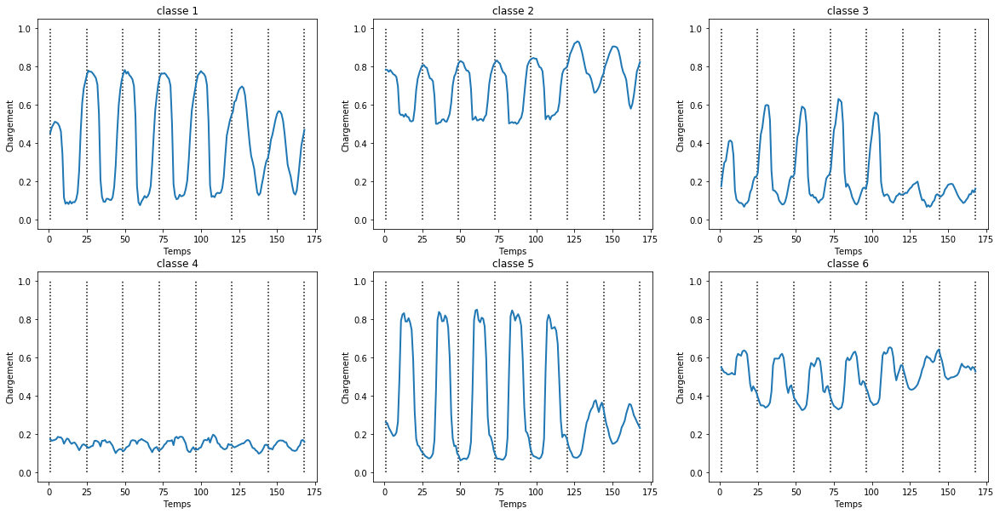

In [46]:
y_pred_cah = fcluster(Z, n_clusters, criterion="maxclust")-1
cah_means = []
plt.figure(3,figsize = (20, 10))
for k in range(n_clusters):
    ax = plt.subplot(2,3,k+1)
    cah_means.append(np.mean(loading[y_pred_cah==k]))
    plt.plot(Time, cah_means[-1], linewidth = 2)
    plt.xlabel('Temps')
    plt.ylabel('Chargement')
    plt.title(f"classe {k+1}")
    vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
plt.show()

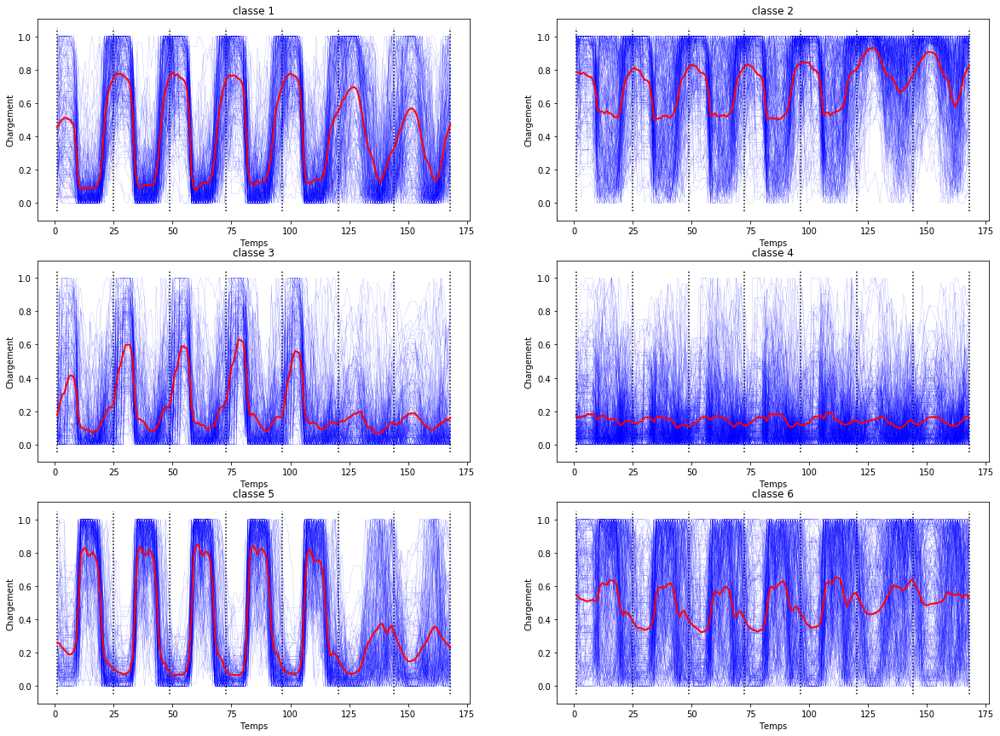

In [47]:
affichageCourbes(y_pred_cah,n_clusters,cah_means)

In [48]:
crossTable(y_pred,y_pred_cah)


max colonne [142. 131. 131. 260. 117. 134.]
j= [4. 2. 1. 3. 0. 5.]

Il y a 274 différences entre les deux tables.
[4. 2. 1. 3. 0. 5.]


array([[142,   0,   0,   2,   0,   8],
       [  0, 131,   0,  23,   0,   1],
       [  0,   3, 131,   0,  61,  10],
       [  6,  11,   0, 260,   0,   1],
       [  0,  58,   0,   0, 117,   0],
       [ 37,  11,  16,  11,  15, 134]], dtype=int64)

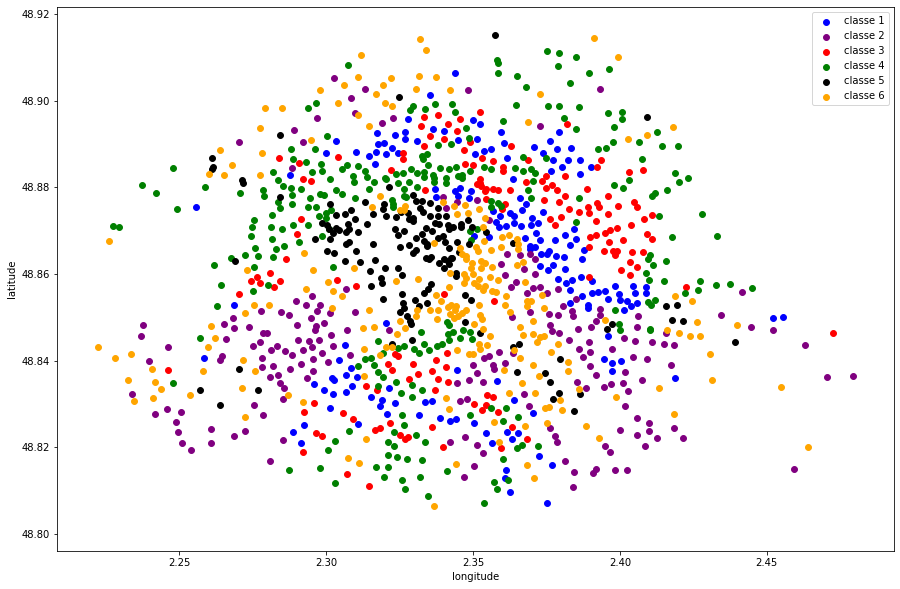

In [49]:
affichageGeoClusters(velibAdds,y_pred_cah,n_clusters,[4,2,1,3,0,5])

### 3.2.2 Clustering sur les coordonnées de l'ACP

In [50]:
Z_acp = linkage(C_pca5,method='ward',metric='euclidean')

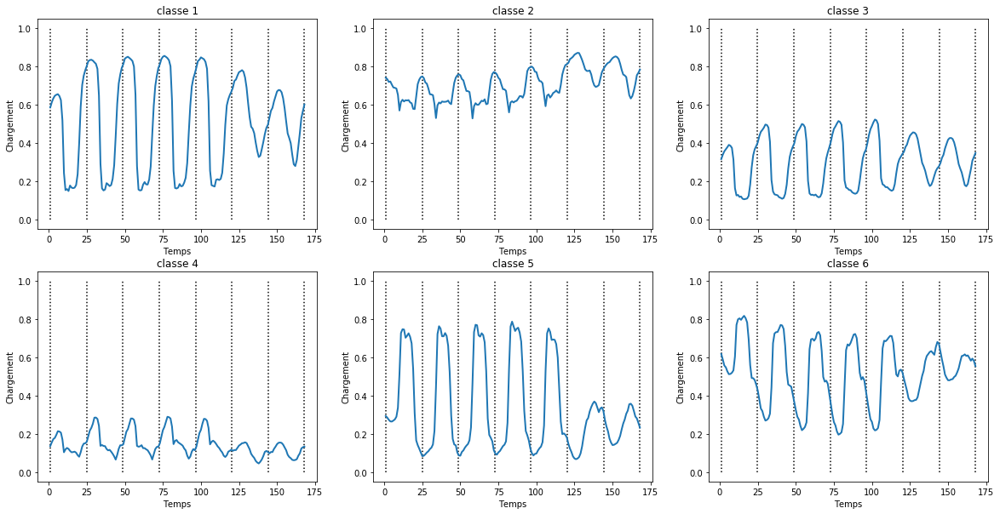

In [51]:
y_pred_cah_acp = fcluster(Z_acp, n_clusters, criterion="maxclust")-1
cah_means_acp = []
for k in range(n_clusters):
    cah_means_acp.append(np.mean(C_pca5[y_pred_cah_acp==k],axis=0))

complement = np.zeros((n_clusters,10))
bar_inv = pca.inverse_transform(np.hstack((cah_means_acp,complement)))


plt.figure(3,figsize = (20, 10))
for k in range(n_clusters):
    ax = plt.subplot(2,3,k+1)
    plt.plot(Time, bar_inv[k], linewidth = 2)
    plt.xlabel('Temps')
    plt.ylabel('Chargement')
    plt.title(f"classe {k+1}")
    vlines(x = np.linspace(1, p, 8), ymin = 0, ymax = 1, colors = "black", linestyle = "dotted")
plt.show()

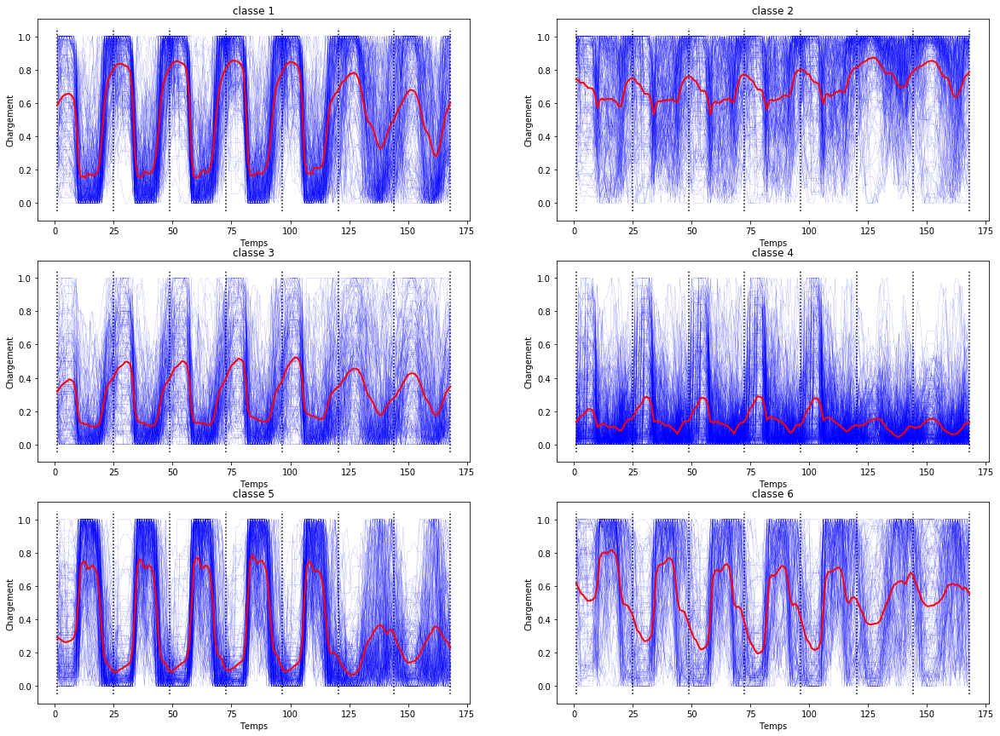

In [52]:
affichageCourbes(y_pred_cah_acp,n_clusters,bar_inv)

In [53]:
crossTable(y_pred,y_pred_cah_acp)


max colonne [165. 110. 130. 248. 161.  98.]
j= [4. 2. 1. 3. 0. 5.]

Il y a 277 différences entre les deux tables.
[4. 2. 1. 3. 0. 5.]


array([[165,   6,   0,  19,   0,  10],
       [  0, 110,   0,  29,  15,   8],
       [  0,   1, 130,   0,  16,  37],
       [  0,  84,   0, 248,   0,   0],
       [  0,  11,  15,   0, 161,   1],
       [ 20,   2,   2,   0,   1,  98]], dtype=int64)

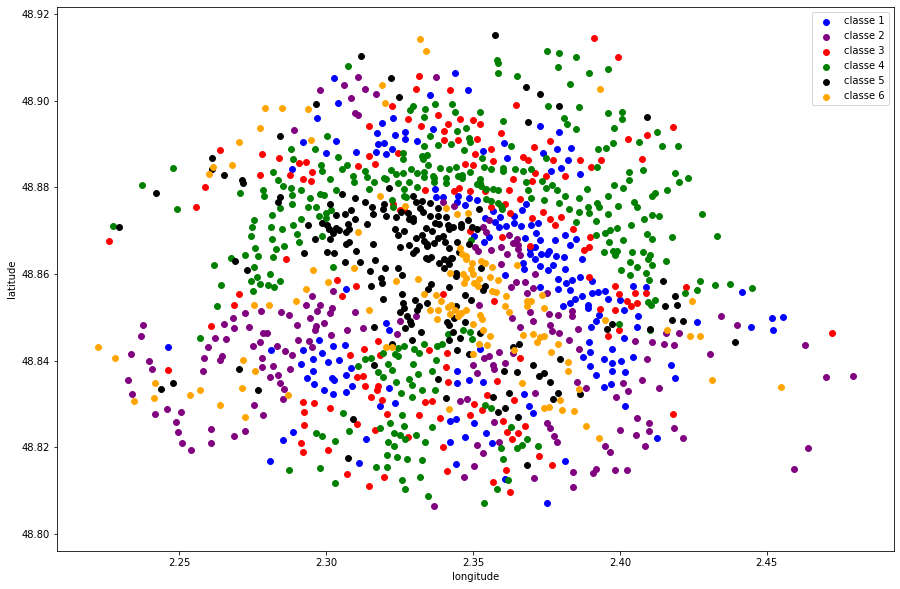

In [54]:
affichageGeoClusters(velibAdds,y_pred_cah_acp,n_clusters,[4,2,1,3,0,5])

In [55]:
crossTable(y_pred_cah,y_pred_cah_acp)


max colonne [114. 135. 100. 232. 144. 112.]
j= [0. 1. 3. 3. 4. 5.]

Il y a 522 différences entre les deux tables.
[0. 1. 0. 3. 4. 5.]


array([[114,  64,   0,   0,   0,  10],
       [  1, 135,   0,   0,   2,  46],
       [  0,   0, 100, 232,   0,   0],
       [  0,   0, 100, 232,   0,   0],
       [  0,   0,   4,  22, 144,  30],
       [  0,   4,   0,   1,   6, 112]], dtype=int64)

## 3.3 Mélange gaussien

### 3.3.1 Clustering sur les données

In [56]:
n_clusters = 6

gm = GaussianMixture(n_components=n_clusters, random_state=4254)
y_pred_gauss = gm.fit(loading).predict(loading)
print(np.shape(gm.means_))

(6, 168)


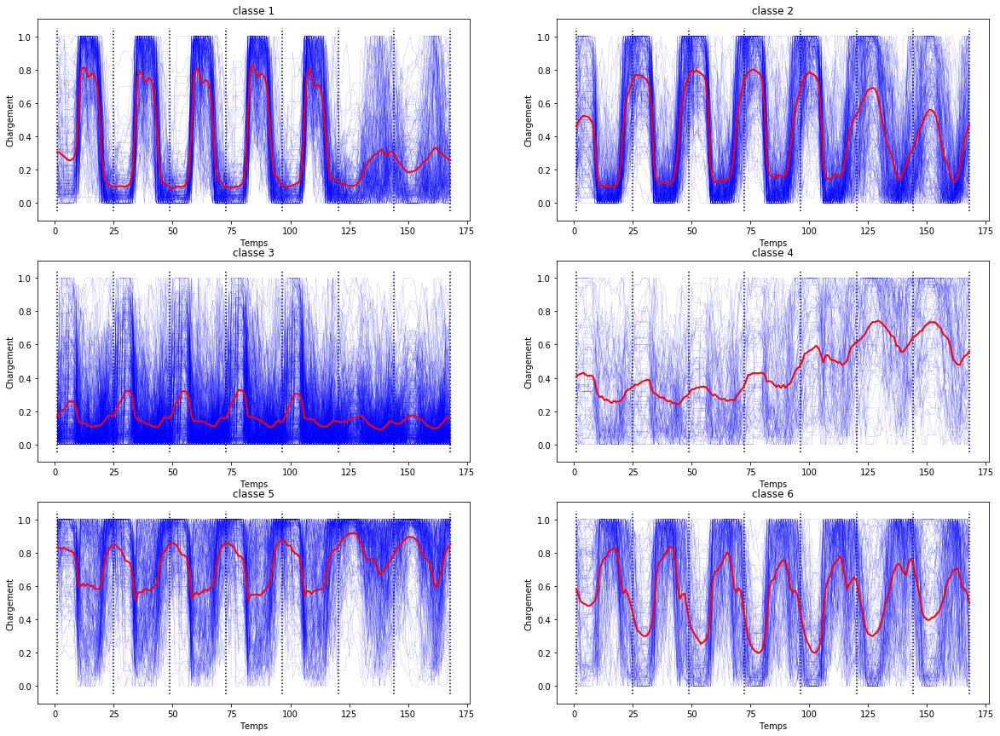

In [57]:
affichageCourbes(y_pred_gauss,n_clusters,gm.means_)

In [58]:
crossTable(y_pred,y_pred_gauss)


max colonne [172. 139. 143. 278. 133. 109.]
j= [0. 2. 4. 2. 1. 5.]

Il y a 551 différences entre les deux tables.
[0. 4. 3. 0. 2. 5.]


array([[172,   2,   0,  10,   0,   1],
       [  0, 139,   0, 278,   0,   0],
       [  0,   0, 143,   0,  38,   7],
       [  0, 139,   0, 278,   0,   0],
       [  0,  62,   0,   0, 133,   0],
       [ 13,   1,   0,   0,   0, 109]], dtype=int64)

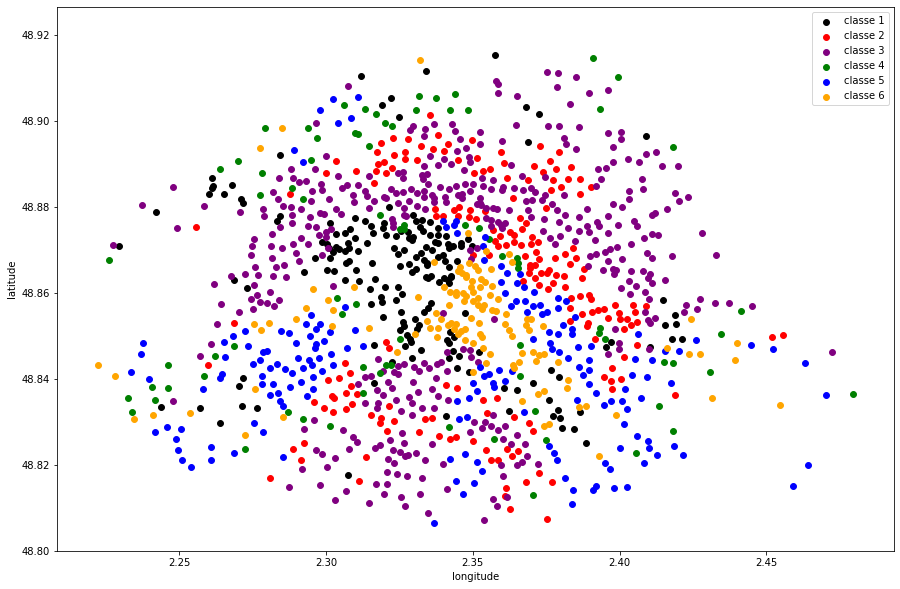

In [59]:
affichageGeoClusters(velibAdds,y_pred_gauss,n_clusters)

### 3.3.2 Clustering sur les coordonnées de l'ACP

In [60]:
gmACP = GaussianMixture(n_components=n_clusters, random_state=4254)
y_pred_gaussACP = gmACP.fit(C_pca5).predict(C_pca5)

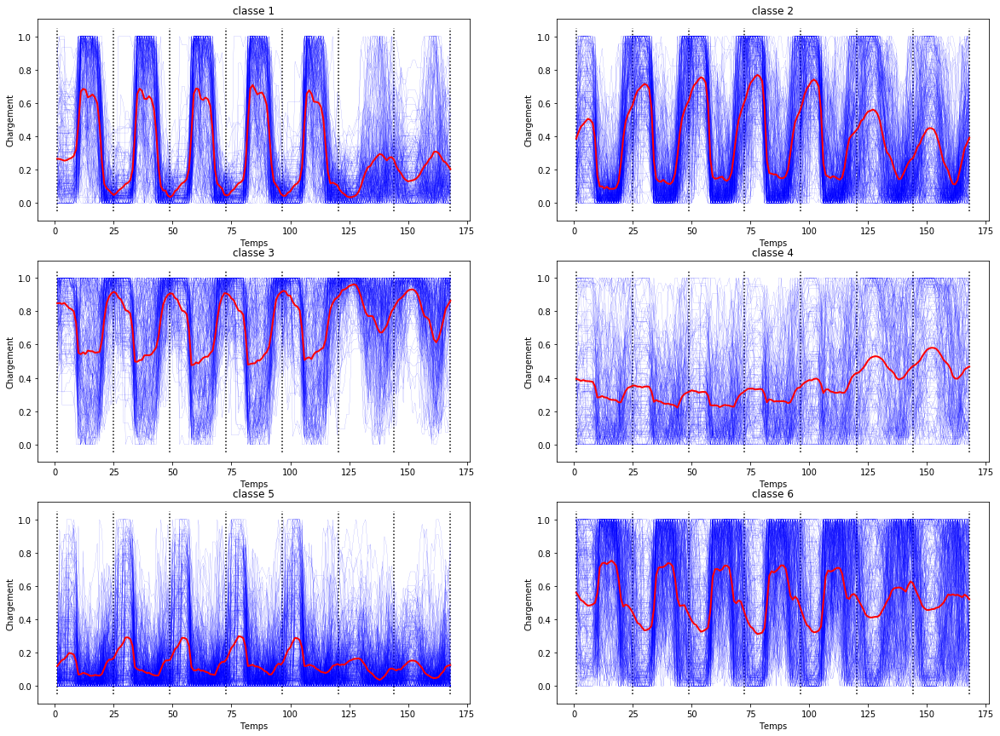

In [61]:
gm_m_acp = gmACP.means_
complement = np.zeros((n_clusters,10))
gm_m_acp_2 = pca.inverse_transform(np.hstack((gm_m_acp,complement)))

affichageCourbes(y_pred_gaussACP,n_clusters,gm_m_acp_2)

In [62]:
crossTable(y_pred,y_pred_gaussACP)


max colonne [125. 107. 113. 200. 119. 124.]
j= [0. 1. 2. 4. 1. 5.]

Il y a 505 différences entre les deux tables.
[0. 4. 2. 0. 3. 5.]


array([[125,   0,   0,  51,   0,   0],
       [  0, 107,   0,   3, 119,   0],
       [  0,   0, 113,   0,  42,   0],
       [  0,  80,   0, 200,   0,   0],
       [  0, 107,   0,   3, 119,   0],
       [ 58,   2,  30,   0,  10, 124]], dtype=int64)

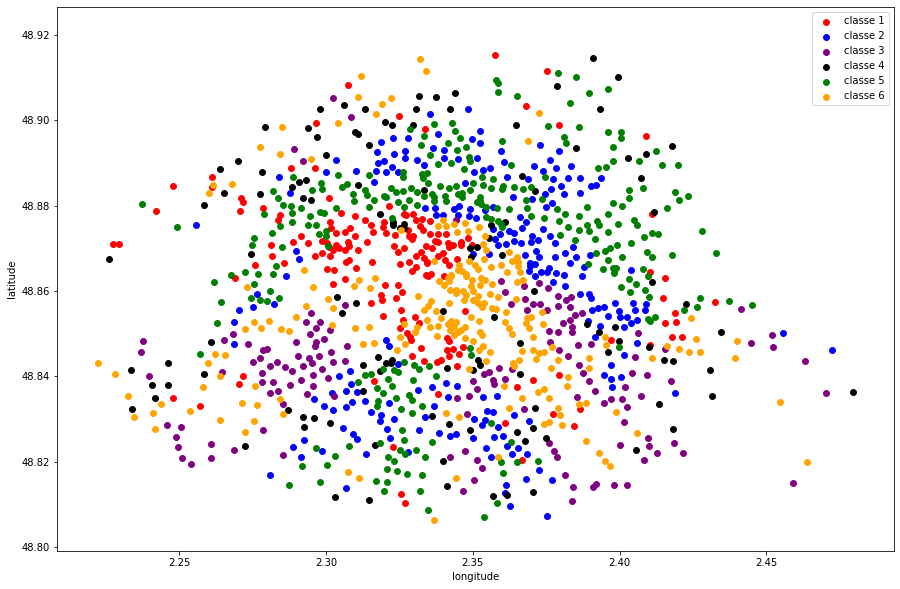

In [63]:
affichageGeoClusters(velibAdds,y_pred_gaussACP,n_clusters,[1,4,2,0,3,5])

## 3.4 Comparaison

In [64]:
import seaborn as sns

def returnDiff(classe1, classe2):
    table = pd.crosstab(classe1, classe2, rownames = ['classes ACP'], colnames = ['classes données brutes'])
    a = np.zeros(np.shape(table)[0])
    b = np.zeros(np.shape(table)[0])
    for j in range (0, np.shape(table)[0]):
        for i in range (0, np.shape(table)[0]):
            if (a[j] < table[i][j]):
                a[j] = table[i][j]
                b[j] = i
    tablebis = np.copy(table)
    for i in range (0, np.shape(table)[0]):
        tablebis[i][:] = table[b[i]][:]
    return np.sum(tablebis)-np.sum(np.diag(tablebis))

def comparaisonGroupe(A):
    name = ["KM","KMacp","CAH","CAHacp","MG","MGacp"]
    Res = np.zeros((6,6))
    for i in range(6):
        for j in range(i,6):
            temp = returnDiff(A[i],A[j])
            Res[i,j] = temp
            if i != j:
                Res[j,i] = temp
    df = pd.DataFrame(Res,index=name,columns=name)
    ax = sns.heatmap(df,cbar_kws={"shrink":.82})
    ax.set_ylim([0,6])
    ax.set_yticklabels(ax.get_yticklabels(),rotation=0)
    return Res

array([[  0.,  22., 274., 277., 551., 505.],
       [ 22.,   0., 286., 265., 551., 495.],
       [274., 286.,   0., 522., 554., 489.],
       [277., 265., 522.,   0., 604., 486.],
       [551., 551., 554., 604.,   0., 270.],
       [505., 495., 489., 486., 270.,   0.]])

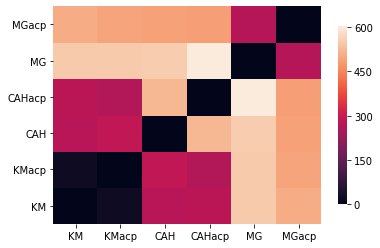

In [65]:
comparaisonGroupe((y_pred,y_pred_pca5,y_pred_cah,y_pred_cah_acp,y_pred_gauss,y_pred_gaussACP))